<a href="https://colab.research.google.com/github/spiyer99/video_remaster/blob/master/laurel_hardy_train.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
#hide
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [15]:
#hide
import fastai
from fastai.vision import *
from fastai.callbacks import *
from fastai.utils.mem import *
import cv2
import glob
import moviepy.editor
from torchvision.models import vgg16_bn

In [8]:
!pip install -q youtube-dl moviepy ipython-autotime

     |████████████████████████████████| 1.9MB 13.7MB/s 


# Creating the Dataset

Creating the dataset was tricky - but still doable. Here's what I did. I downloaded high quality videos into from youtube. Then I ruined them. I added black specs and reduced the resolution of the video. [Ffmpeg](https://ffmpeg.org/) was very useful in doing this. 

First we'll download the video.

In [4]:
#hide
!rm -rf seinfeld
!mkdir seinfeld
!mkdir seinfeld/images

In [5]:
#hide
path = Path('seinfeld')
path_hr = path/'images'
path_lr = path/'small-96'
path_mr = path/'small-256'

In [37]:
ORIGINAL_VIDEO = 'video.mp4'
CLEAN_VIDEO = 'clean.mp4'
CRAPPY_VIDEO = 'crappy.mp4'

In [38]:
def show_short_video(file, seconds = 10):

  from pathlib import Path

  path = Path(file)

  new_file_name = path.stem + '_short' + path.suffix
  output_file = path.parents[0]/str(new_file_name)
  print(output_file)

  # output_file = os.path.dirname(file) + '/' + os.path.basename(file).split('.')[0]+'_short.'+os.path.basename(file).split('.')[1]
  # show_video('seinfeld_short.mp4')

  end_time = '00:00:'+str(seconds)
  !ffmpeg -loglevel warning -y -ss 00:00:00 -i $file -c copy -t $end_time $output_file

  from IPython.display import HTML
  from base64 import b64encode
  mp4 = open(output_file,'rb').read()
  data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
  return HTML("""
  <video width=400 controls>
        <source src="%s" type="video/mp4">
  </video>
  """ % data_url)

def get_height_width_video(file):

  vcap = cv2.VideoCapture(file) # 0=camera
  
  # width  = vcap.get(cv2.cv.CV_CAP_PROP_FRAME_WIDTH)   # float `width`
  # height = vcap.get(cv2.cv.CV_CAP_PROP_FRAME_HEIGHT)  # float `height`
  width  = vcap.get(3)  # float `width`
  height = vcap.get(4)  # float `height`

  return height, width

def get_duration_video(file):
  return moviepy.editor.VideoFileClip(file).duration

In [39]:
!rm -Rf original_videos
!mkdir original_videos
%cd 'original_videos'

/content/original_videos


In [40]:
def combine_videos(folder, output):

  # write all videos to txt
  merge_file = 'merge_file.txt'
  write_videos_to_txt(merge_file, folder)

  # combine videos
  !ffmpeg -loglevel warning -y -f concat -safe 0 -i $merge_file -c copy $output

def write_to_txt(file, video_path):
  with open(file, 'a') as f:
      f.write("file  '%s'\n" % video_path)

def write_videos_to_txt(merge_file, folder):
  if Path(merge_file).exists():
    os.remove(merge_file)

  # write videos to txt
  for i, file in enumerate(glob.glob(str(Path(folder)/'*.*'))):
    new_name = os.path.dirname(file) + '/' +str(i) + Path(file).suffix
    os.rename(file, new_name)
    print(new_name)
    write_to_txt(merge_file, new_name)

!youtube-dl --format best https://www.youtube.com/watch?v=HCSELv-koGo&ab_channel=jeffsabu 
!youtube-dl --format best https://www.youtube.com/watch?v=BP6iG4k4zoQ&t=1s&ab_channel=jeffsabu 
!youtube-dl --format best https://www.youtube.com/watch?v=UbcV9hfMo_0&ab_channel=jeffsabu 
!youtube-dl --format best https://www.youtube.com/watch?v=jDjaDaELXO0&ab_channel=jeffsabu 
!youtube-dl --format best https://www.youtube.com/watch?v=Q0d5TOd7oRc&ab_channel=jeffsabu 

[youtube] HCSELv-koGo: Downloading webpage
[download] Destination: Their First Mistake Comparison-HCSELv-koGo.mp4
[download] 100% of 10.70MiB in 00:00
[youtube] BP6iG4k4zoQ: Downloading webpage
[download] Destination: Me and My Pal Comparison-BP6iG4k4zoQ.mp4
[download] 100% of 15.22MiB in 00:00
[youtube] UbcV9hfMo_0: Downloading webpage
[youtube] UbcV9hfMo_0: Downloading MPD manifest
[download] Destination: One Good Turn Comparison-UbcV9hfMo_0.mp4
[download] 100% of 22.67MiB in 00:00
[youtube] jDjaDaELXO0: Downloading webpage
[youtube] jDjaDaELXO0: Downloading MPD manifest
[download] Destination: Hog Wild Comparison-jDjaDaELXO0.mp4
[download] 100% of 18.85MiB in 00:00
[youtube] Q0d5TOd7oRc: Downloading webpage
[youtube] Q0d5TOd7oRc: Downloading MPD manifest
[download] Destination: Beau Hunks (Trailer) Comparison-Q0d5TOd7oRc.mp4
[download] 100% of 13.20MiB in 00:00


In [41]:
%%capture
%cd /content
combine_videos('/content/original_videos', ORIGINAL_VIDEO)

In [42]:
show_short_video(ORIGINAL_VIDEO)

video_short.mp4


In [43]:
get_duration_video(ORIGINAL_VIDEO)

359.05

In [44]:
height, width = get_height_width_video(ORIGINAL_VIDEO)
height, width

(720.0, 1280.0)

In [45]:
# crop videos
crop_string = "crop=in_w/2:"+str(height - 100)+":in_w/2:in_h/2"
!ffmpeg -y -loglevel warning -i $ORIGINAL_VIDEO -filter:v $crop_string -c:a copy $CLEAN_VIDEO

In [46]:
show_short_video(CLEAN_VIDEO)

clean_short.mp4


In [47]:
# crop crappy video
crop_string = "crop=in_w/2:in_h:0:" + str(100)
!ffmpeg -y -loglevel warning -i $ORIGINAL_VIDEO -filter:v $crop_string -c:a copy $CRAPPY_VIDEO

In [48]:
show_short_video(CRAPPY_VIDEO)

crappy_short.mp4


# Extract Frames

Now we'll extract frames from each video. Initially I adopted a naive approach for doing this. Where I would do through the video in python and scrape each frame individually. But that took too long. 

We can use multi-processing here to really speed things up. This was adapted from [Hayden Faulker's](https://gist.github.com/HaydenFaulkner/54318fd3e9b9bdb66c5440c44e4e08b8#file-video_to_frames-py) script.

In [49]:
#hide

%cd /content
!rm -Rf $path_lr
!rm -Rf $path_mr
!rm -Rf $path_hr
path_hr.mkdir(parents=True, exist_ok=True)
path_lr.mkdir(parents=True, exist_ok=True)
path_hr.mkdir(parents=True, exist_ok=True)

/content


## equal fps

In [50]:
#hide
%%time
import math
import cv2
# Drop frame rate
def equal_fps(clean,crappy):

  cap = cv2.VideoCapture(clean)
  clean_fps = int(cap.get(cv2.CAP_PROP_FPS))
  print(clean_fps)

  # !ffmpeg -y -i $crappy -c copy -f h264 seeing_noaudio.h264
  # !ffmpeg -y -r $clean_fps -i seeing_noaudio.h264 -c copy 'crappy.mp4'
  # !rm seeing_noaudio.h264
  !ffmpeg -loglevel warning -y -i $crappy -filter:v fps=fps=$clean_fps 'crappy_fps_adjusted.mp4'

  # !ffmpeg -y -i $clean -c copy -f h264 seeing_noaudio.h264
  # !ffmpeg -y -r $clean_fps -i seeing_noaudio.h264 -c copy 'clean.mp4'
  !ffmpeg -loglevel warning -y -i $clean -filter:v fps=fps=$clean_fps 'clean_fps_adjusted.mp4'

  return 'crappy_fps_adjusted.mp4', 'clean_fps_adjusted.mp4'

crappy, clean = equal_fps(CLEAN_VIDEO,CRAPPY_VIDEO)
crappy, clean

23
CPU times: user 278 ms, sys: 52.2 ms, total: 330 ms
Wall time: 1min 47s


In [51]:
#hide
def get_fps(file):
  cap = cv2.VideoCapture(file)
  fps = cap.get(cv2.CAP_PROP_FPS)
  return fps

print(get_fps(crappy))
print(get_fps(clean))

23.0
23.0


In [52]:
#hide
show_short_video(clean, seconds = 30)

clean_fps_adjusted_short.mp4


In [53]:
#hide
show_short_video(crappy, seconds = 30)

crappy_fps_adjusted_short.mp4


In [54]:
# from https://gist.github.com/HaydenFaulkner/54318fd3e9b9bdb66c5440c44e4e08b8#file-video_to_frames-py

from concurrent.futures import ProcessPoolExecutor, as_completed
import cv2
import multiprocessing
import os
import sys


def print_progress(iteration, total, prefix='', suffix='', decimals=3, bar_length=100):
    """
    Call in a loop to create standard out progress bar

    :param iteration: current iteration
    :param total: total iterations
    :param prefix: prefix string
    :param suffix: suffix string
    :param decimals: positive number of decimals in percent complete
    :param bar_length: character length of bar
    :return: None
    """

    format_str = "{0:." + str(decimals) + "f}"  # format the % done number string
    percents = format_str.format(100 * (iteration / float(total)))  # calculate the % done
    filled_length = int(round(bar_length * iteration / float(total)))  # calculate the filled bar length
    bar = '#' * filled_length + '-' * (bar_length - filled_length)  # generate the bar string
    sys.stdout.write('\r%s |%s| %s%s %s' % (prefix, bar, percents, '%', suffix)),  # write out the bar
    sys.stdout.flush()  # flush to stdout


def extract_frames(video_path, frames_dir, overwrite=False, start=-1, end=-1, every=1):
    """
    Extract frames from a video using OpenCVs VideoCapture

    :param video_path: path of the video
    :param frames_dir: the directory to save the frames
    :param overwrite: to overwrite frames that already exist?
    :param start: start frame
    :param end: end frame
    :param every: frame spacing
    :return: count of images saved
    """

    video_path = os.path.normpath(video_path)  # make the paths OS (Windows) compatible
    frames_dir = os.path.normpath(frames_dir)  # make the paths OS (Windows) compatible

    video_dir, video_filename = os.path.split(video_path)  # get the video path and filename from the path

    assert os.path.exists(video_path)  # assert the video file exists

    capture = cv2.VideoCapture(video_path)  # open the video using OpenCV

    if start < 0:  # if start isn't specified lets assume 0
        start = 0
    if end < 0:  # if end isn't specified assume the end of the video
        end = int(capture.get(cv2.CAP_PROP_FRAME_COUNT))

    capture.set(1, start)  # set the starting frame of the capture
    frame = start  # keep track of which frame we are up to, starting from start
    while_safety = 0  # a safety counter to ensure we don't enter an infinite while loop (hopefully we won't need it)
    saved_count = 0  # a count of how many frames we have saved

    while frame < end:  # lets loop through the frames until the end

        _, image = capture.read()  # read an image from the capture

        if while_safety > 500:  # break the while if our safety maxs out at 500
            break

        # sometimes OpenCV reads None's during a video, in which case we want to just skip
        if image is None:  # if we get a bad return flag or the image we read is None, lets not save
            while_safety += 1  # add 1 to our while safety, since we skip before incrementing our frame variable
            continue  # skip

        if frame % every == 0:  # if this is a frame we want to write out based on the 'every' argument
            while_safety = 0  # reset the safety count
            save_path = os.path.join(frames_dir, "{:010d}.jpg".format(frame))  # create the save path
            if not os.path.exists(save_path) or overwrite:  # if it doesn't exist or we want to overwrite anyways
                cv2.imwrite(save_path, image)  # save the extracted image
                saved_count += 1  # increment our counter by one

        frame += 1  # increment our frame count

    capture.release()  # after the while has finished close the capture

    return saved_count  # and return the count of the images we saved


def video_to_frames(video_path, frames_dir, overwrite=False, every=1, chunk_size=1000):
    """
    Extracts the frames from a video using multiprocessing

    :param video_path: path to the video
    :param frames_dir: directory to save the frames
    :param overwrite: overwrite frames if they exist?
    :param every: extract every this many frames
    :param chunk_size: how many frames to split into chunks (one chunk per cpu core process)
    :return: path to the directory where the frames were saved, or None if fails
    """

    video_path = os.path.normpath(video_path)  # make the paths OS (Windows) compatible
    frames_dir = os.path.normpath(frames_dir)  # make the paths OS (Windows) compatible

    video_dir, video_filename = os.path.split(video_path)  # get the video path and filename from the path

    # make directory to save frames, its a sub dir in the frames_dir with the video name
    # os.makedirs(os.path.join(frames_dir, video_filename), exist_ok=True)

    capture = cv2.VideoCapture(video_path)  # load the video
    total = int(capture.get(cv2.CAP_PROP_FRAME_COUNT))  # get its total frame count
    capture.release()  # release the capture straight away

    if total < 1:  # if video has no frames, might be and opencv error
        print("Video has no frames. Check your OpenCV + ffmpeg installation, can't read videos!!!\n"
              "You may need to install OpenCV by source not pip")
        return None  # return None

    frame_chunks = [[i, i+chunk_size] for i in range(0, total, chunk_size)]  # split the frames into chunk lists
    frame_chunks[-1][-1] = min(frame_chunks[-1][-1], total-1)  # make sure last chunk has correct end frame

    prefix_str = "Extracting frames from {}".format(video_filename)  # a prefix string to be printed in progress bar

    # execute across multiple cpu cores to speed up processing, get the count automatically
    with ProcessPoolExecutor(max_workers=multiprocessing.cpu_count()) as executor:

        futures = [executor.submit(extract_frames, video_path, frames_dir, overwrite, f[0], f[1], every)
                   for f in frame_chunks]  # submit the processes: extract_frames(...)

        for i, f in enumerate(as_completed(futures)):  # as each process completes
            print_progress(i, len(frame_chunks)-1, prefix=prefix_str, suffix='Complete')  # print it's progress

    return os.path.join(frames_dir, video_filename)  # when done return the directory containing the frames


In [55]:
%cd /content
video_to_frames(video_path=crappy, frames_dir=str(path_lr), overwrite=True, every=1, chunk_size=1000)
video_to_frames(video_path=clean, frames_dir=str(path_hr), overwrite=True, every=1, chunk_size=1000)

/content
Extracting frames from clean_fps_adjusted.mp4 |####################################################################################################| 100.000% Complete

'seinfeld/images/clean_fps_adjusted.mp4'

In [56]:
import cv2

# https://stackoverflow.com/questions/33311153/python-extracting-and-saving-video-frames
def get_frames_from_video(fn, i, video_path, output_path):

  print(fn, i, video_path, output_path)
  
  vidcap = cv2.VideoCapture(video_path)
  success,image = vidcap.read()
  count = 0
  while success:
    cv2.imwrite(output_path + "/frame%d.jpg" % count, image)     # save frame as JPEG file      
    success,image = vidcap.read()
    # print('Read a new frame: ', success)
    count += 1

In [57]:
# parallel(partial(get_frames_from_video, video_path=crappy, output_path=str(path_lr)), [1])
# parallel(partial(get_frames_from_video, video_path=clean, output_path=str(path_hr)), [1])

This is what the crappy and normal images looked like now. Side note: this is a great scene from seinfeld.

![alt text](/images/star_wars/crappy_vs_clean_comparison.png)
![alt text](/images/star_wars/crappy_vs_clean_comparison1.png)

A quick check shows that we have a dataset of about `10014` files. Pretty good.


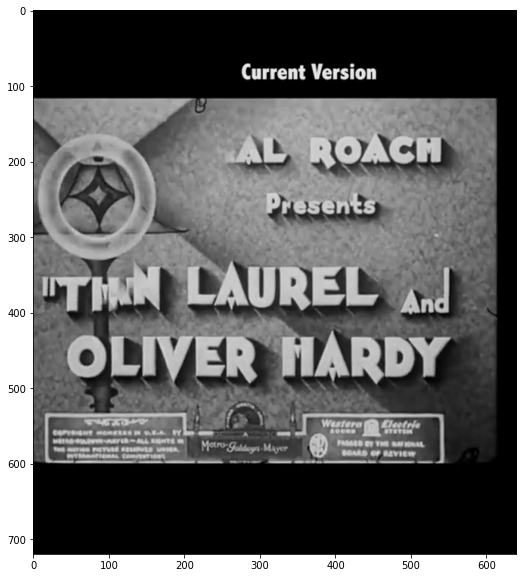

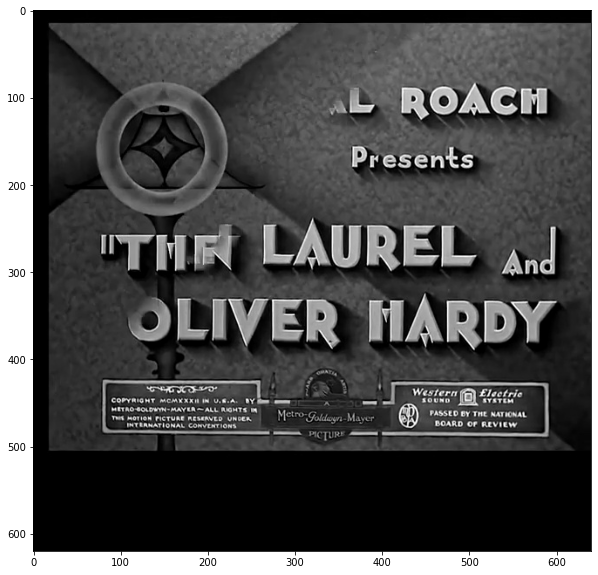

In [58]:
import glob

def plot_random_img():

  file = random.choice(glob.glob('seinfeld/small-96/*.jpg'))
  img = PIL.Image.open(file)
  plt.figure(figsize=(10,10))
  plt.imshow(img)
  plt.show()

  file = file.replace('small-96', 'images')
  img = PIL.Image.open(file)
  plt.figure(figsize=(10,10))
  plt.imshow(img)
  plt.show()

plot_random_img()

In [59]:
# crop imgs
from google.colab.patches import cv2_imshow

files = glob.glob(str(path_lr)+'/*.*g')

for file in files:
  original = PIL.Image.open(file)

  width, height = original.size   # Get dimensions
  left = 0
  top = 100
  right = width
  bottom = height
  cropped_example = original.crop((left, top, right, bottom))

  os.remove(file)
  cropped_example.save(file, quality = 100)


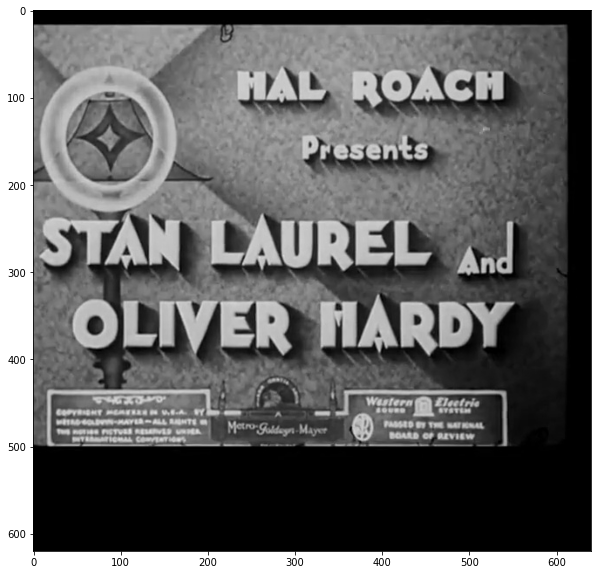

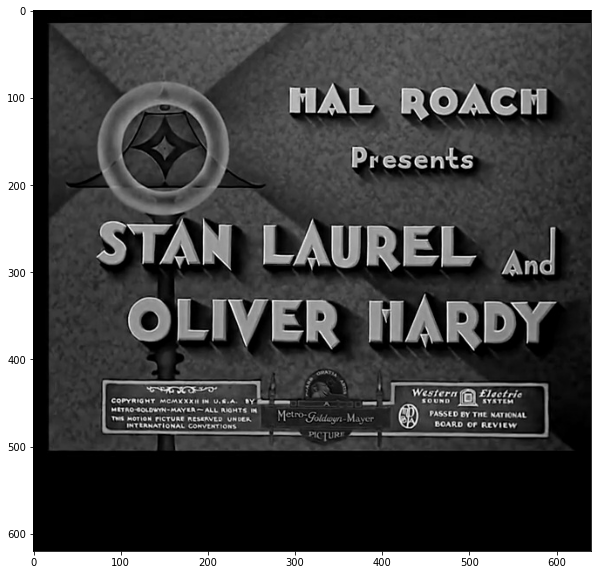

In [60]:
plot_random_img()

In [61]:
#hide
import glob
len(glob.glob(str(path_hr)+'/*.*g')), len(glob.glob(str(path_lr)+'/*.*g'))

(2203, 2203)

The above shows what the crappy and normal images looked like now. Side note: this is a great scene from seinfeld.

A quick check shows that we have a dataset of about `10014` files. Pretty good.



## Adjust Brightness and resize
adjust brightness to rectify the brightness problem we had earlier. 

Resize to introduce upscaling to the model in addition to cue marks removal


In [62]:
# # test this

# def resize_one(fn, i, path):
#     img = PIL.Image.open(path)
#     size = img.size[0]//3
#     targ_sz = resize_to(img, size, use_min=True)
#     img = img.resize(targ_sz, resample=PIL.Image.BILINEAR).convert('RGB')
#     os.remove(path)
#     img.save(path, quality=100)

# def adjust_brightness(fn, i, path, factor = 0.8):
#   img = PIL.Image.open(path)
#   enhancer = PIL.ImageEnhance.Brightness(img)
#   img = enhancer.enhance(factor)
#   os.remove(path)
#   img.save(path, quality = 60)

# def run_parallel(files, path):
#   # parallel(partial(resize_one, path=path), files)
#   parallel(partial(adjust_brightness, path=path, factor = 0.7), files)

# run_parallel(glob.glob(str(path_lr) + '/*.*g'), path_lr)
# run_parallel(glob.glob(str(path_hr) + '/*.*g'), path_hr)

In [63]:
# import glob
# import PIL
# from tqdm.notebook import tqdm

# def adjust_brightness(img, factor = 0.8):
#   enhancer = PIL.ImageEnhance.Brightness(img)
#   img = enhancer.enhance(factor)
#   return img

# def resize_one(img, size):
#     targ_sz = resize_to(img, size, use_min = True)
#     img = img.resize(targ_sz, resample = PIL.Image.BILINEAR).convert('RGB')
#     return img

# path = '/content/seinfeld/small-96/*.*g'
# files = glob.glob(path)
# files = sorted(files, key = lambda x: int(os.path.basename(x).split('.')[0]))

# for i in tqdm(range(len(files))):

#   file = files[i]

#   img = PIL.Image.open(file)

#   # brightness
#   img = adjust_brightness(img)

#   # resize img
#   img = resize_one(img, size = img.size[0]//3)

#   # delete file and save new image
#   os.remove(file)
#   img.save(file, quality=60)

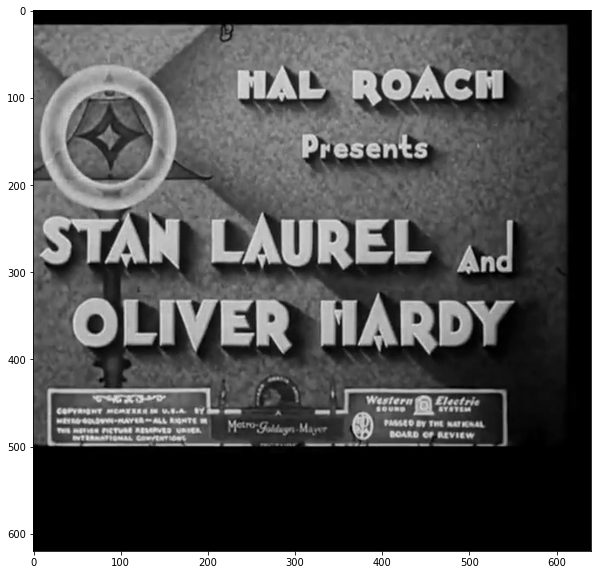

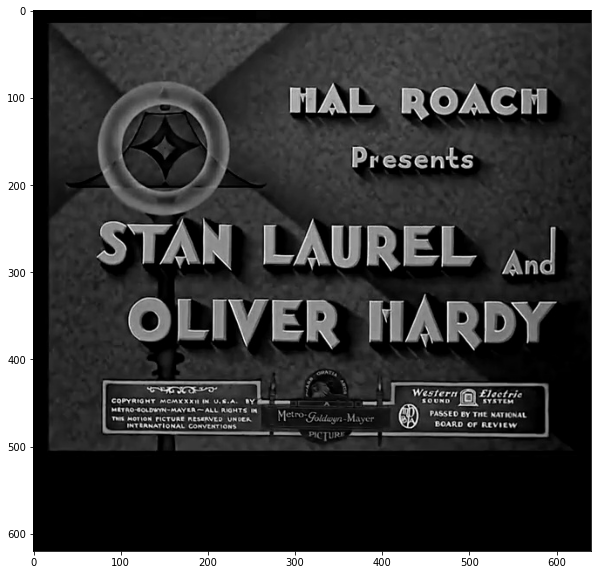

In [64]:
plot_random_img()

## Delete files that have annoying size

In [65]:
def remove_files_without_size(files):

  height = max(PIL.Image.open(file).size[0] for file in files) # get max height
  width = max(PIL.Image.open(file).size[1] for file in files) # get max width
  full_size = (height, width)

  # print(full_size)

  for file in files:
    img = PIL.Image.open(file)
    # print(img.size)
    if (img.size != full_size):
      print(f'will need to remove {file} and corresponding file')
      # os.remove(file)

  return full_size


# files = glob.glob(str(path_hr/'*.*g'))
# remove_files_without_size(files)

files = glob.glob(str(path_lr/'*.*g'))
full_size = remove_files_without_size(files)

In [66]:
full_size

(640, 620)

# training helpers

In [67]:
#hide
import shutil
def copy_to_drive():
  learn.export()
  model_path = learn.path/'export.pkl'
  !mkdir /content/drive/"My Drive"/lh_restorer
  # shutil.copyfile(model_path, '/content/drive/My Drive/seinfeld/export1.pkl')
  !cp $model_path /content/drive/"My Drive"/lh_restorer/


# Fastai training


## Neural Network

Let's make the most of those `10014` files by using transforms.

I added horizontal and vertical flips, zoom changes, lighting changes and rotation changes. With Fastai this is really easy to do.


In [ ]:
#hide
learn = None
gc.collect()

19884

In [ ]:
#hide
torch.cuda.empty_cache()
free = gpu_mem_get_free_no_cache()
print("{} MB of GPU RAM free".format(free))

16157 MB of GPU RAM free


In [ ]:
bs,size=64,128
# bs,size=8,480
arch = models.resnet34
src = ImageImageList.from_folder(path_lr).split_by_rand_pct(0.1, seed=42)

In [ ]:
#hide
tfms = get_transforms(do_flip=True, flip_vert=True, max_zoom = 1.1, max_lighting=0.2, max_rotate = 10)
# tfms = ([zoom_crop(scale=(0.75,2), do_rand=True), rand_resize_crop(224), rotate(degrees=(-30,30), p=0.75)], [])
tfms

([RandTransform(tfm=TfmCrop (crop_pad), kwargs={'row_pct': (0, 1), 'col_pct': (0, 1), 'padding_mode': 'reflection'}, p=1.0, resolved={}, do_run=True, is_random=True, use_on_y=True),
  RandTransform(tfm=TfmAffine (dihedral_affine), kwargs={}, p=1.0, resolved={}, do_run=True, is_random=True, use_on_y=True),
  RandTransform(tfm=TfmCoord (symmetric_warp), kwargs={'magnitude': (-0.2, 0.2)}, p=0.75, resolved={}, do_run=True, is_random=True, use_on_y=True),
  RandTransform(tfm=TfmAffine (rotate), kwargs={'degrees': (-10, 10)}, p=0.75, resolved={}, do_run=True, is_random=True, use_on_y=True),
  RandTransform(tfm=TfmAffine (zoom), kwargs={'scale': (1.0, 1.1), 'row_pct': (0, 1), 'col_pct': (0, 1)}, p=0.75, resolved={}, do_run=True, is_random=True, use_on_y=True),
  RandTransform(tfm=TfmLighting (brightness), kwargs={'change': (0.4, 0.6)}, p=0.75, resolved={}, do_run=True, is_random=True, use_on_y=True),
  RandTransform(tfm=TfmLighting (contrast), kwargs={'scale': (0.8, 1.25)}, p=0.75, resolved={

In [ ]:
#hide
import PIL
import random

# def get_max_size_of_image():
#   img = PIL.Image.open(random.choice(glob.glob(str(path_hr/'*.*g'))))
#   return max(img.size[0], img.size[1])

def get_data(bs,size=None,resize_method=ResizeMethod.CROP):

    if (size is None):
      data = (src.label_from_func(lambda x: path_hr/x.name)
            .transform(tfms, tfm_y=True)
            .databunch(bs=bs).normalize(imagenet_stats, do_y=True))
    else:
      data = (src.label_from_func(lambda x: path_hr/x.name)
            .transform(tfms,size=size, tfm_y=True, resize_method = resize_method)
            .databunch(bs=bs).normalize(imagenet_stats, do_y=True))

    data.c = 3
    return data

In [ ]:
#hide
import warnings
warnings.filterwarnings('ignore')

In [ ]:
#hide
bs = 8
data = get_data(bs,size)

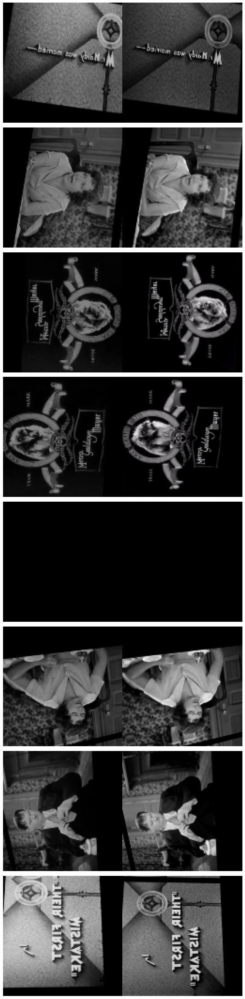

In [ ]:
#hide
data.show_batch(ds_type=DatasetType.Train, rows=10)

Here's some of the image transforms.

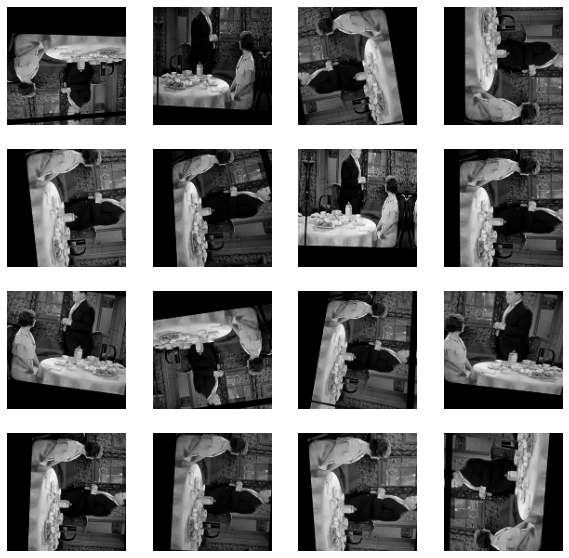

In [ ]:
def _plot(i,j,ax):
    x,y = data.train_ds[8]
    # print(x,y)
    x.show(ax, y=y)

plot_multi(_plot, 4, 4, figsize=(10,10))

Not bad! 

We'll use the [NoGAN network](https://www.fast.ai/2019/05/03/decrappify/) pioneered by fastai and jason antic on this data. This code was inspired by [lesson 7](https://github.com/fastai/course-v3/blob/master/nbs/dl1/lesson7-superres.ipynb) of the fastai course.

## Feature loss

In [ ]:
t = data.valid_ds[0][1].data
t = torch.stack([t,t])

def gram_matrix(x):
    n,c,h,w = x.size()
    x = x.view(n, c, -1)
    return (x @ x.transpose(1,2))/(c*h*w)

In [ ]:
gram_matrix(t)

tensor([[[0.0424, 0.0424, 0.0424],
         [0.0424, 0.0424, 0.0424],
         [0.0424, 0.0424, 0.0424]],

        [[0.0424, 0.0424, 0.0424],
         [0.0424, 0.0424, 0.0424],
         [0.0424, 0.0424, 0.0424]]])

In [ ]:
base_loss = F.l1_loss

vgg_m = vgg16_bn(True).features.cuda().eval()
requires_grad(vgg_m, False)

Downloading: "https://download.pytorch.org/models/vgg16_bn-6c64b313.pth" to /root/.cache/torch/hub/checkpoints/vgg16_bn-6c64b313.pth


In [ ]:
blocks = [i-1 for i,o in enumerate(children(vgg_m)) if isinstance(o,nn.MaxPool2d)]
blocks, [vgg_m[i] for i in blocks]

([5, 12, 22, 32, 42],
 [ReLU(inplace=True),
  ReLU(inplace=True),
  ReLU(inplace=True),
  ReLU(inplace=True),
  ReLU(inplace=True)])

In [ ]:
class FeatureLoss(nn.Module):
    def __init__(self, m_feat, layer_ids, layer_wgts):
        super().__init__()
        self.m_feat = m_feat
        self.loss_features = [self.m_feat[i] for i in layer_ids]
        self.hooks = hook_outputs(self.loss_features, detach=False)
        self.wgts = layer_wgts
        self.metric_names = ['pixel',] + [f'feat_{i}' for i in range(len(layer_ids))
              ] + [f'gram_{i}' for i in range(len(layer_ids))]

    def make_features(self, x, clone=False):
        self.m_feat(x)
        return [(o.clone() if clone else o) for o in self.hooks.stored]
    
    def forward(self, input, target):
        out_feat = self.make_features(target, clone=True)
        in_feat = self.make_features(input)
        self.feat_losses = [base_loss(input,target)]
        self.feat_losses += [base_loss(f_in, f_out)*w
                             for f_in, f_out, w in zip(in_feat, out_feat, self.wgts)]
        self.feat_losses += [base_loss(gram_matrix(f_in), gram_matrix(f_out))*w**2 * 5e3
                             for f_in, f_out, w in zip(in_feat, out_feat, self.wgts)]
        self.metrics = dict(zip(self.metric_names, self.feat_losses))
        return sum(self.feat_losses)
    
    def __del__(self): self.hooks.remove()

In [ ]:
feat_loss = FeatureLoss(vgg_m, blocks[2:5], [5,15,2])

I trained the model on [google colab’s free gpus](https://colab.research.google.com/). They’re a great resource and I can’t believe they are free. 

## Training

The interesting thing that fastai [recommends](https://www.youtube.com/watch?v=9spwoDYwW_I) is increasing the size of your images gradually. 

So at first you train on small size images, then you upscale your images and retrain on the larger images. It saves you a lot of time. Pretty smart. 

First we'll train on images of size 128x128. Because the images are so small I can up the batch size to 64. 


In [ ]:
data = get_data(bs=64,size=128)

In [ ]:
learn = None
gc.collect()
wd = 1e-3
learn = unet_learner(data, arch, wd=wd, loss_func=feat_loss, callback_fns=LossMetrics,blur=True, norm_type=NormType.Weight)

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


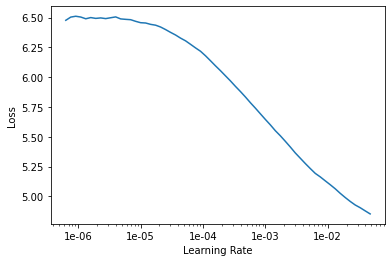

In [ ]:
learn.lr_find()
learn.recorder.plot()

Min numerical gradient: 2.51E-03
Min loss divided by 10: 4.79E-03


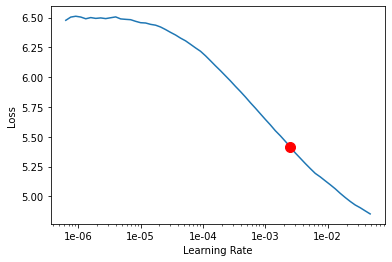

In [ ]:
learn.recorder.plot(suggestion=True)

I picked a learning rate of `1e-3` for this. I wanted something aggressive, but still on the safe side of explosion. This has been [shown](https://sgugger.github.io/how-do-you-find-a-good-learning-rate.html) to be very useful.

In [ ]:
lr = 2.51E-03
lr

0.00251

In [ ]:
#hide
def do_fit(save_name, lrs=slice(lr), pct_start=0.9, cycles = 10):
    learn.fit_one_cycle(cycles, lrs, pct_start=pct_start)
    learn.save(save_name)
    learn.show_results(rows=2, imgsize=7)
    copy_to_drive()





![alt text](/images/star_wars/first_train.png)



epoch,train_loss,valid_loss,pixel,feat_0,feat_1,feat_2,gram_0,gram_1,gram_2,time
0,2.795754,2.484585,0.393648,0.271566,0.312716,0.078425,0.467113,0.859443,0.101674,00:45
1,2.733813,2.386829,0.377483,0.264727,0.306688,0.075767,0.429147,0.834899,0.098118,00:45
2,2.684622,2.231380,0.370209,0.254703,0.294388,0.072586,0.386042,0.759024,0.094427,00:44
3,2.611403,2.194006,0.380917,0.255007,0.291723,0.071006,0.368003,0.734409,0.092942,00:44
4,2.585016,2.209383,0.368234,0.253106,0.291391,0.071841,0.380233,0.750714,0.093863,00:45
5,2.563045,2.288431,0.369956,0.253676,0.295807,0.072727,0.387777,0.813710,0.094778,00:44
6,2.598921,2.243310,0.424852,0.249517,0.289725,0.072179,0.368125,0.743814,0.095098,00:45
7,2.580985,2.187141,0.385055,0.249631,0.286243,0.069534,0.368805,0.736748,0.091126,00:45
8,2.525673,2.053938,0.353519,0.242753,0.278114,0.067357,0.343347,0.681235,0.087614,00:45
9,2.416777,1.925207,0.339395,0.235538,0.269011,0.064729,0.298612,0.632936,0.084985,00:45


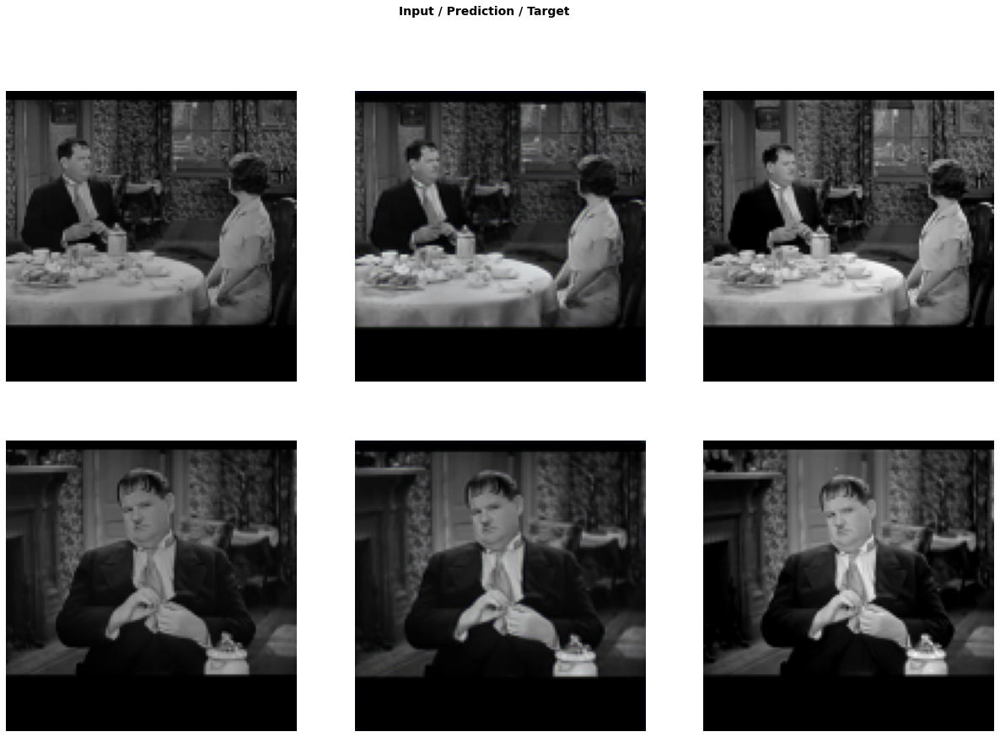

In [ ]:
do_fit('1a', lrs = slice(lr))

The network will print the results during training. The input is on the left, the prediction in the middle and the target on the right. The results look very promising!

In [ ]:
#hide
learn.unfreeze()

epoch,train_loss,valid_loss,pixel,feat_0,feat_1,feat_2,gram_0,gram_1,gram_2,time
0,2.128736,1.901407,0.336065,0.234322,0.267597,0.064321,0.293087,0.621661,0.084353,00:45
1,2.108676,1.890751,0.333362,0.233442,0.266079,0.063903,0.292355,0.617835,0.083776,00:45
2,2.100050,1.883561,0.332563,0.233246,0.265540,0.063753,0.290562,0.613918,0.083978,00:45
3,2.115980,1.909443,0.332423,0.234375,0.267778,0.064067,0.296470,0.629672,0.084657,00:44
4,2.149529,1.964043,0.342248,0.235987,0.268357,0.065580,0.316643,0.648339,0.086889,00:45
5,2.169722,2.059931,0.353609,0.242659,0.275951,0.065434,0.333184,0.702873,0.086221,00:45
6,2.224425,1.966493,0.339746,0.236224,0.272308,0.065299,0.302257,0.664379,0.086279,00:44
7,2.267247,2.031592,0.339012,0.238441,0.274056,0.065356,0.342494,0.686331,0.085902,00:44
8,2.293649,2.028896,0.344441,0.238851,0.276929,0.066105,0.331260,0.684902,0.086408,00:45
9,2.269122,1.877894,0.335658,0.231443,0.263066,0.063282,0.289206,0.611182,0.084058,00:45


mkdir: cannot create directory ‘/content/drive/My Drive/lh_restorer’: File exists


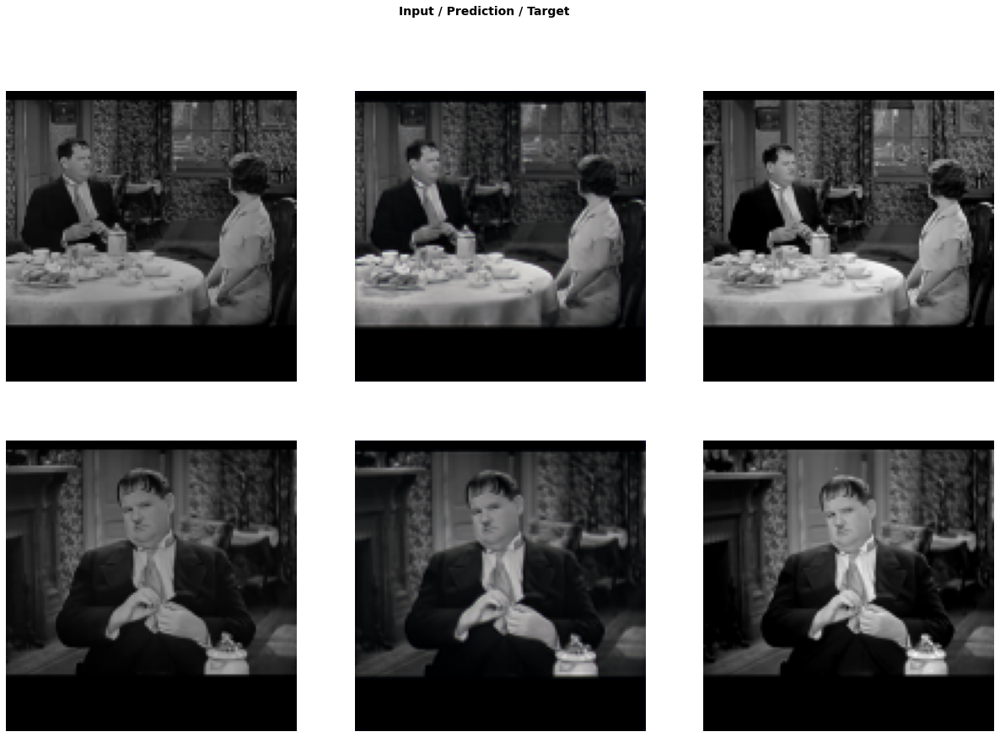

In [ ]:
#hide
do_fit('1b', slice(lr))

I resize and train again. And again. Every time I make the resize slightly larger than it was previously. I moved from 128x128 to 480x480 to the original size of the video frames. 

## Upscale

In [ ]:
data = get_data(bs=4, size=480)

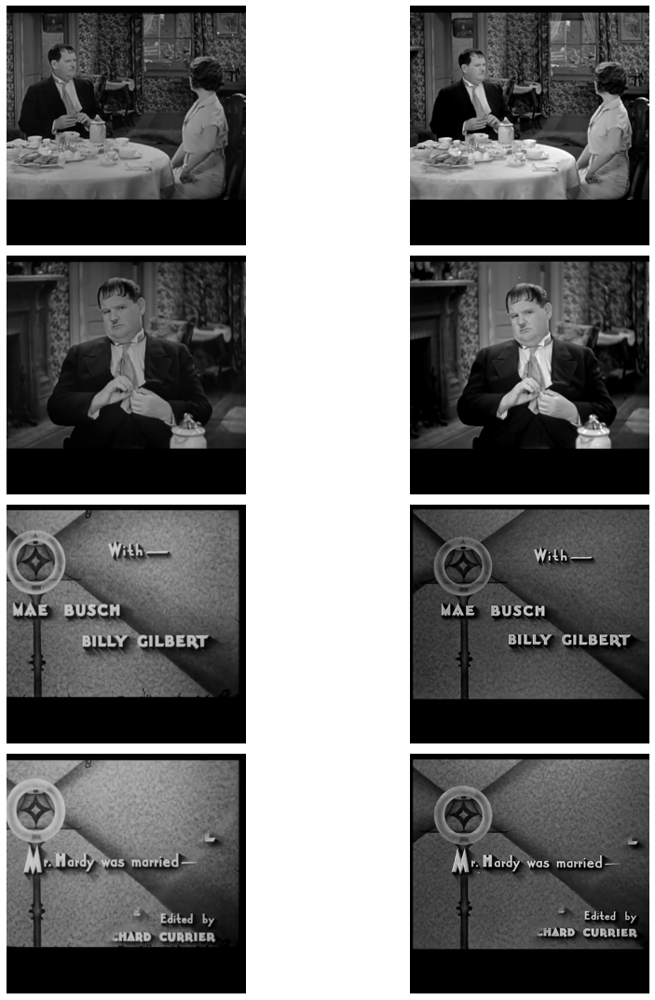

In [ ]:
data.show_batch(ds_type=DatasetType.Valid, rows=10, figsize=(15,15))

In [ ]:
learn.data = data
learn.freeze()
gc.collect()

16481

In [ ]:
#hide_output
learn.load('1b')

Learner(data=ImageDataBunch;

Train: LabelList (1486 items)
x: ImageImageList
Image (3, 480, 480),Image (3, 480, 480),Image (3, 480, 480),Image (3, 480, 480),Image (3, 480, 480)
y: ImageList
Image (3, 480, 480),Image (3, 480, 480),Image (3, 480, 480),Image (3, 480, 480),Image (3, 480, 480)
Path: seinfeld/small-96;

Valid: LabelList (165 items)
x: ImageImageList
Image (3, 480, 480),Image (3, 480, 480),Image (3, 480, 480),Image (3, 480, 480),Image (3, 480, 480)
y: ImageList
Image (3, 480, 480),Image (3, 480, 480),Image (3, 480, 480),Image (3, 480, 480),Image (3, 480, 480)
Path: seinfeld/small-96;

Test: None, model=DynamicUnet(
  (layers): ModuleList(
    (0): Sequential(
      (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (4): Sequential(
   

epoch,train_loss,valid_loss,pixel,feat_0,feat_1,feat_2,gram_0,gram_1,gram_2,time


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


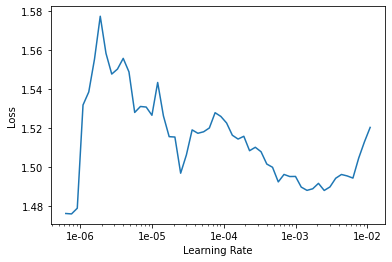

In [ ]:
#hide
learn.lr_find()
learn.recorder.plot()

Min numerical gradient: 2.29E-06
Min loss divided by 10: 7.59E-08


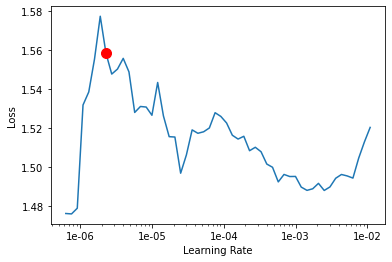

In [ ]:
#hide
learn.recorder.plot(suggestion=True)

In [ ]:
lr = learn.recorder.min_grad_lr
lr, lr/10

(2.2908676527677735e-06, 2.2908676527677735e-07)

epoch,train_loss,valid_loss,pixel,feat_0,feat_1,feat_2,gram_0,gram_1,gram_2,time
0,1.533048,1.379826,0.427558,0.247940,0.246293,0.054978,0.168609,0.197280,0.037169,02:15
1,1.512127,1.372218,0.435181,0.247076,0.244550,0.054500,0.162159,0.192139,0.036613,02:15
2,1.509172,1.346288,0.416679,0.246035,0.243691,0.054156,0.158454,0.190962,0.036310,02:16
3,1.470665,1.348819,0.428939,0.245615,0.242663,0.053932,0.154781,0.186903,0.035986,02:15
4,1.475991,1.339002,0.425588,0.245085,0.241999,0.053711,0.151875,0.184987,0.035757,02:15
5,1.433743,1.325016,0.417869,0.244303,0.241178,0.053320,0.149466,0.183460,0.035420,02:15
6,1.481283,1.309188,0.409741,0.243486,0.240277,0.052806,0.146812,0.181215,0.034851,02:18
7,1.450143,1.313424,0.417890,0.243170,0.239615,0.052764,0.145741,0.179423,0.034820,02:16
8,1.427469,1.292855,0.402806,0.242439,0.238900,0.052258,0.143566,0.178240,0.034647,02:17
9,1.409915,1.300958,0.413518,0.242551,0.238600,0.052143,0.143054,0.176721,0.034371,02:17


mkdir: cannot create directory ‘/content/drive/My Drive/lh_restorer’: File exists


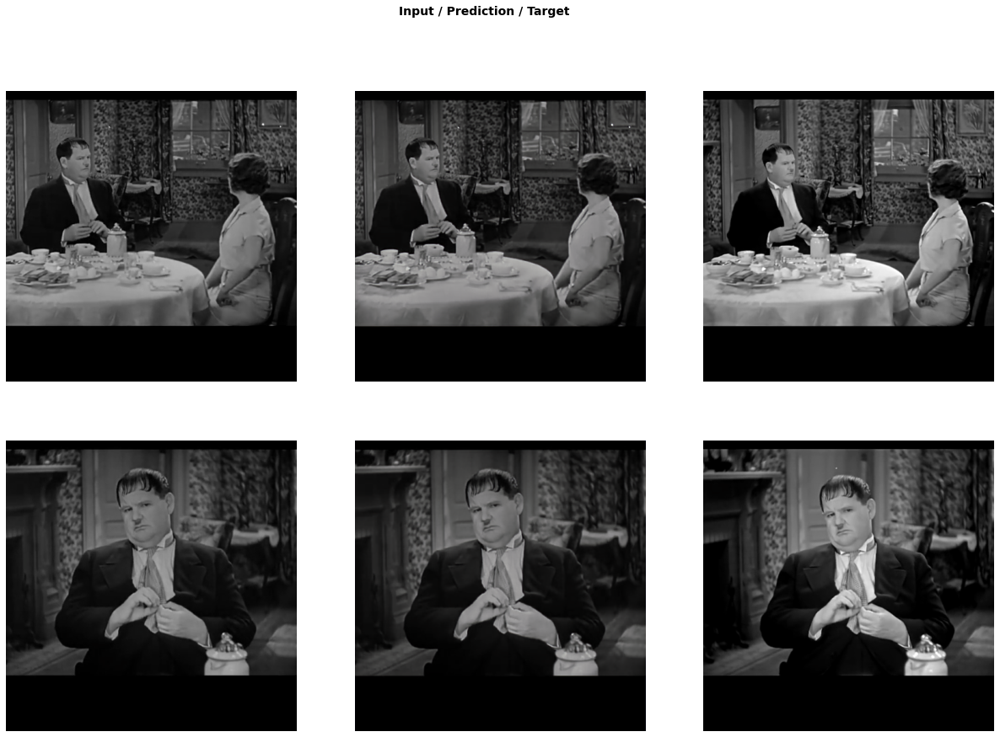

In [ ]:
do_fit('2a', lrs=slice(lr), cycles = 20)

epoch,train_loss,valid_loss,pixel,feat_0,feat_1,feat_2,gram_0,gram_1,gram_2,time
0,1.371797,1.253967,0.388028,0.240850,0.236033,0.051009,0.135191,0.169566,0.033290,02:18
1,1.353302,1.253041,0.387356,0.240697,0.235917,0.050946,0.135205,0.169628,0.033292,02:17
2,1.374684,1.248227,0.384738,0.240589,0.235714,0.050835,0.134248,0.168964,0.033139,02:18
3,1.345538,1.248923,0.386768,0.240802,0.235713,0.050875,0.133579,0.168188,0.032997,02:18
4,1.357970,1.245911,0.385874,0.240659,0.235555,0.050755,0.132663,0.167605,0.032800,02:19
5,1.361320,1.245910,0.384819,0.240474,0.235472,0.050751,0.133732,0.167763,0.032899,02:18
6,1.343235,1.235389,0.379850,0.240441,0.235223,0.050604,0.130624,0.166081,0.032567,02:19
7,1.322849,1.229282,0.375297,0.240647,0.235388,0.050499,0.130075,0.165014,0.032361,02:18
8,1.338282,1.220122,0.369169,0.239936,0.234548,0.050329,0.128862,0.164905,0.032373,02:18
9,1.315251,1.212133,0.364098,0.240124,0.234779,0.050205,0.126815,0.163945,0.032167,02:19


mkdir: cannot create directory ‘/content/drive/My Drive/lh_restorer’: File exists


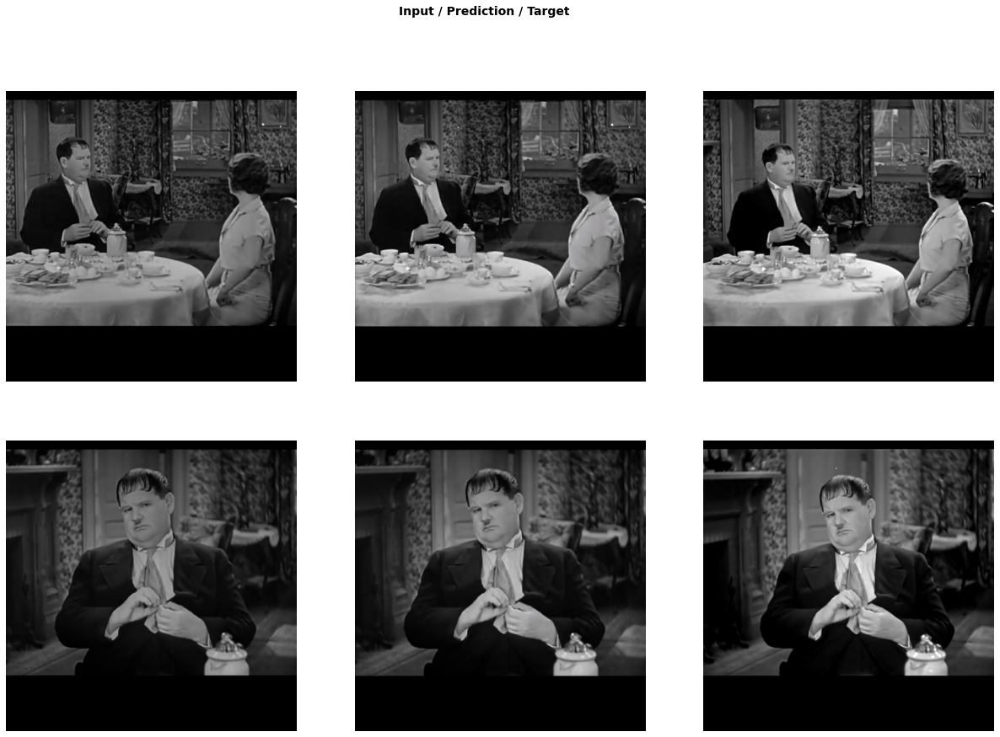

In [ ]:
#hide
do_fit('2b', lrs = slice(lr/10, lr*10), cycles = 20)

## Final Upscale

In [ ]:
max(full_size)

640

In [ ]:
#hide
data = get_data(bs=1, size = None)

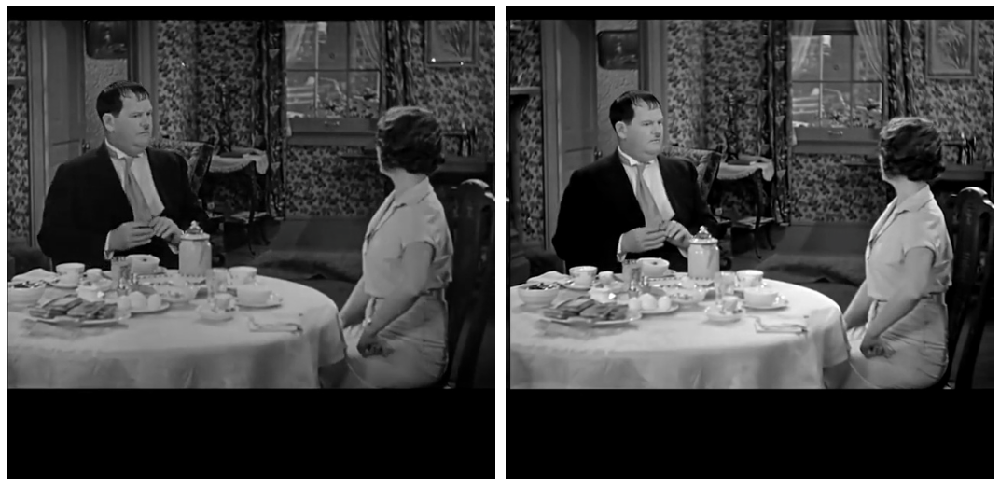

In [ ]:
#hide
data.show_batch(ds_type=DatasetType.Valid, rows=10, figsize=(15,15))

In [ ]:
#hide
gc.collect()
learn.data = data
learn.freeze()
gc.collect()

0

In [ ]:
#hide
learn.load('2b')

Learner(data=ImageDataBunch;

Train: LabelList (1486 items)
x: ImageImageList
Image (3, 620, 640),Image (3, 620, 640),Image (3, 620, 640),Image (3, 620, 640),Image (3, 620, 640)
y: ImageList
Image (3, 620, 640),Image (3, 620, 640),Image (3, 620, 640),Image (3, 620, 640),Image (3, 620, 640)
Path: seinfeld/small-96;

Valid: LabelList (165 items)
x: ImageImageList
Image (3, 620, 640),Image (3, 620, 640),Image (3, 620, 640),Image (3, 620, 640),Image (3, 620, 640)
y: ImageList
Image (3, 620, 640),Image (3, 620, 640),Image (3, 620, 640),Image (3, 620, 640),Image (3, 620, 640)
Path: seinfeld/small-96;

Test: None, model=DynamicUnet(
  (layers): ModuleList(
    (0): Sequential(
      (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (4): Sequential(
   

epoch,train_loss,valid_loss,pixel,feat_0,feat_1,feat_2,gram_0,gram_1,gram_2,time


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


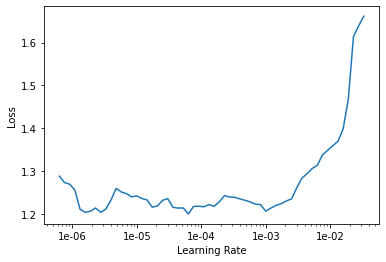

In [ ]:
#hide
learn.lr_find()
learn.recorder.plot()

Min numerical gradient: 1.10E-06
Min loss divided by 10: 6.31E-06


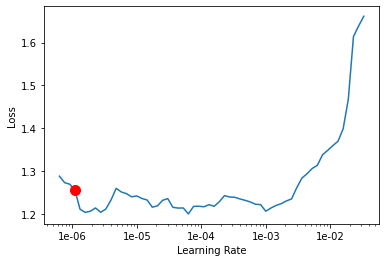

In [ ]:
#hide
learn.recorder.plot(suggestion=True)

In [ ]:
#hide
lr = learn.recorder.min_grad_lr
lr, lr/10

(1.096478196143185e-06, 1.0964781961431852e-07)

epoch,train_loss,valid_loss,pixel,feat_0,feat_1,feat_2,gram_0,gram_1,gram_2,time
0,1.277517,1.163115,0.351661,0.239730,0.234084,0.049293,0.114166,0.149264,0.024916,04:09
1,1.210228,1.165208,0.351285,0.239644,0.233901,0.049290,0.115327,0.150657,0.025104,04:08
2,1.205674,1.163064,0.350887,0.239640,0.233944,0.049162,0.115007,0.149506,0.024918,04:08
3,1.216264,1.166941,0.352125,0.239828,0.233849,0.049128,0.115916,0.150923,0.025171,04:08
4,1.221227,1.168871,0.352251,0.239961,0.233913,0.049209,0.117144,0.151162,0.025232,04:07
5,1.182741,1.169253,0.352706,0.240077,0.234120,0.049115,0.118031,0.150133,0.025070,04:07
6,1.243990,1.170364,0.352673,0.240181,0.233949,0.049105,0.118466,0.150773,0.025217,04:08
7,1.194932,1.174154,0.354435,0.240633,0.234054,0.049245,0.118712,0.151672,0.025403,04:08
8,1.171330,1.182373,0.357376,0.241297,0.234763,0.049488,0.119720,0.154010,0.025719,04:09
9,1.178905,1.171645,0.353796,0.240646,0.234167,0.049082,0.118900,0.149968,0.025086,04:09


mkdir: cannot create directory ‘/content/drive/My Drive/lh_restorer’: File exists


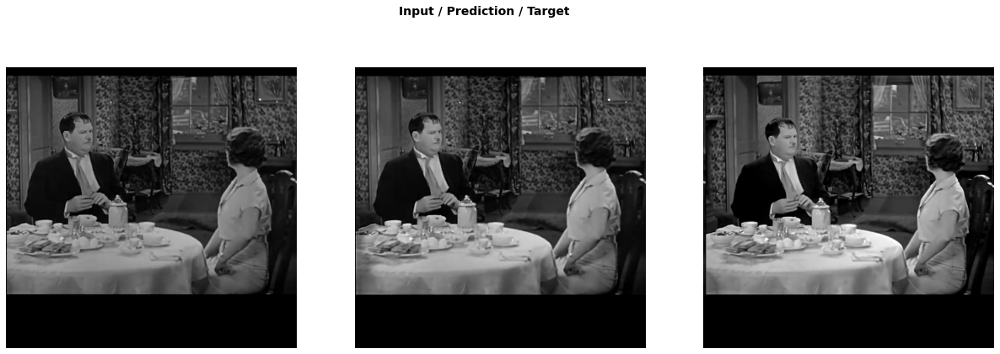

In [ ]:
#hide
do_fit('3a', slice(lr), cycles = 10)

epoch,train_loss,valid_loss,pixel,feat_0,feat_1,feat_2,gram_0,gram_1,gram_2,time
0,1.203890,1.171805,0.353204,0.240577,0.234205,0.049081,0.120165,0.149555,0.025018,04:09
1,1.167589,1.175079,0.354292,0.240699,0.234242,0.049023,0.121406,0.150314,0.025105,04:07
2,1.167961,1.171978,0.352958,0.241335,0.234554,0.049150,0.119967,0.148910,0.025104,04:08
3,1.120759,1.177764,0.354559,0.241903,0.235258,0.049456,0.120661,0.150499,0.025428,04:09
4,1.138526,1.169429,0.352308,0.240874,0.234093,0.049123,0.119129,0.148948,0.024953,04:08
5,1.195147,1.166117,0.350322,0.241227,0.234200,0.049078,0.119032,0.147415,0.024843,04:08
6,1.106740,1.170627,0.350937,0.241702,0.234398,0.049179,0.120611,0.148805,0.024994,04:08
7,1.123802,1.162884,0.348939,0.241460,0.234139,0.049123,0.118416,0.146082,0.024727,04:09
8,1.101127,1.168952,0.354326,0.241998,0.234993,0.049607,0.116699,0.146385,0.024944,04:08
9,1.170258,1.163056,0.348309,0.240816,0.233236,0.049005,0.120402,0.146381,0.024907,04:08


mkdir: cannot create directory ‘/content/drive/My Drive/lh_restorer’: File exists


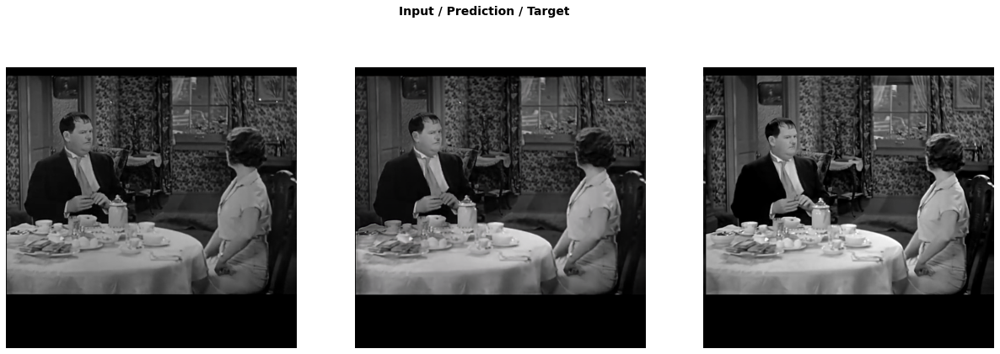

In [ ]:
#hide
do_fit('3b', slice(lr/10, lr*10), cycles = 10)
# do_fit('3b', slice(1e-3, 1e-4), pct_start=0.3, cycles = 2)

# pix2pix

In [68]:
%cd /content
!git clone https://github.com/junyanz/pytorch-CycleGAN-and-pix2pix

/content
Cloning into 'pytorch-CycleGAN-and-pix2pix'...
remote: Enumerating objects: 2337, done.
remote: Total 2337 (delta 0), reused 0 (delta 0), pack-reused 2337
Receiving objects: 100% (2337/2337), 8.09 MiB | 22.58 MiB/s, done.
Resolving deltas: 100% (1499/1499), done.


In [69]:
import os
from pathlib import Path
import glob
%cd 'pytorch-CycleGAN-and-pix2pix/'

/content/pytorch-CycleGAN-and-pix2pix


In [70]:
!pip install -r requirements.txt

     |████████████████████████████████| 686kB 13.6MB/s 
     |████████████████████████████████| 61kB 9.2MB/s 
  Created wheel for visdom: filename=visdom-0.1.8.9-cp37-none-any.whl size=655251 sha256=1c69b0a0db087abaf3f119ee8c25f688027b547b1fc0517c30e877df6177b1a3
  Stored in directory: /root/.cache/pip/wheels/70/19/a7/6d589ed967f4dfefd33bc166d081257bd4ed0cb618dccfd62a
  Created wheel for torchfile: filename=torchfile-0.1.0-cp37-none-any.whl size=5713 sha256=ce6a8a895cdbfa060cab4058e44767b2e68ddd649a244356f098f8ac89aba31a
  Stored in directory: /root/.cache/pip/wheels/b1/c3/d6/9a1cc8f3a99a0fc1124cae20153f36af59a6e683daca0a0814
Successfully built visdom torchfile


## Training



In [71]:
%cd /content/pytorch-CycleGAN-and-pix2pix

/content/pytorch-CycleGAN-and-pix2pix


In [72]:
import gc; gc.collect()
torch.cuda.empty_cache()

In [86]:
NAME = 'cyclegan_laurel_hardy_cue_marks'
DRIVE_FOLDER_NAME = 'cyclegan_laurel_hardy_cue_marks'
BATCH_SIZE = 4
# CROP_SIZE = 256
CROP_SIZE = 512
LOAD_SIZE = 1024
EPOCHS=50
MODEL = 'pix2pix'

In [99]:
%cd /content

/content


In [104]:
# migrate to cyclegan

DATAROOT = Path('dataroot')
DATAROOT.mkdir(exist_ok = True)
TRAIN_A = DATAROOT/'trainA'
TRAIN_A.mkdir(exist_ok = True)
TRAIN_B = DATAROOT/'trainB'
TRAIN_B.mkdir(exist_ok = True)

for file in path_lr.glob('*.*g'): shutil.copyfile(file, str(DATAROOT/'trainA'/Path(file).name))
for file in path_hr.glob('*.*g'): shutil.copyfile(file, str(DATAROOT/'trainB'/Path(file).name))

TEST_A = DATAROOT/'testA'
TEST_B = DATAROOT/'testB'
TEST_A.mkdir(parents = True, exist_ok = True)
TEST_B.mkdir(parents = True, exist_ok = True)

In [112]:
# move images to a new folder
# `images` is the existing image directory: 
# `new_dir` is the path that the images will be moved to
# `files_limit` is the limit of files that will be moved
def move_all_images_to_new_folder(images, new_dir, files_limit = None):
  files = glob.glob(str(images/'*.*g'))

  if(files_limit is not None):
    files = random.sample(files, files_limit)

  for file in files: shutil.move(file, new_dir/os.path.basename(file))

move_all_images_to_new_folder(TRAIN_A, new_dir = TEST_A, files_limit = 25)
move_all_images_to_new_folder(TRAIN_B, new_dir = TEST_B, files_limit = 25)

2153 imgs in TRAIN_A directory


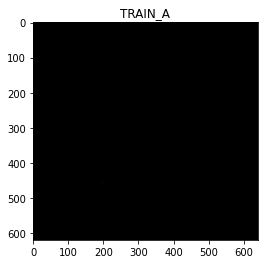

2153 imgs in TRAIN_B directory


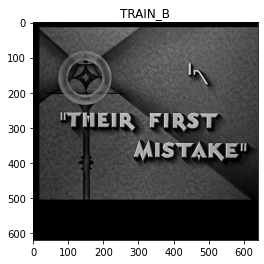

50 imgs in TEST_A directory


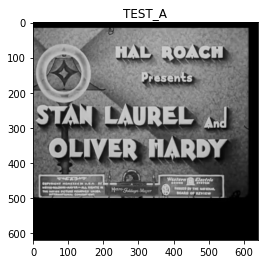

50 imgs in TEST_B directory


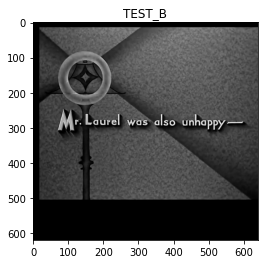

In [113]:
import PIL
import random

def plot_from_image_path(path, title, number = 1):

  all_imgs = glob.glob(str(path/'*.*g'))

  print(f'{len(all_imgs)} imgs in {title} directory')

  if (len(all_imgs)!=0):
    for i in range(number):
      img_path = random.choice(all_imgs)
      img = PIL.Image.open(img_path)
      plt.imshow(img)
      plt.title(title)
      plt.show()

plot_from_image_path(TRAIN_A, 'TRAIN_A')
plot_from_image_path(TRAIN_B, 'TRAIN_B')
plot_from_image_path(TEST_A, 'TEST_A')
plot_from_image_path(TEST_B, 'TEST_B')

Helper functions. Here's a few helper functions to assist with:

- copying checkpoints to google drive
- testing the model after checkpoints are copied

In [121]:
import os
from pathlib import Path
from distutils.dir_util import copy_tree
import matplotlib.pyplot as plt
import random
import shutil
import warnings
import time
warnings.filterwarnings("ignore")

# copy folder to gdrive
def copy_to_drive(folder = DRIVE_FOLDER_NAME):

  drive_folder = Path('/content/drive/My Drive/')/folder

  if (drive_folder.exists()):
    shutil.rmtree(drive_folder) # delete folder
    time.sleep(60) # wait 1 min for gdrive to move folder to trash
    gdrive_empty_trash() # empty trash
  else:
    drive_folder.mkdir(parents = True)

  shutil.copytree('/content/pytorch-CycleGAN-and-pix2pix/checkpoints/'+NAME+'/', str(drive_folder))


# gdrive empty trash folder
def gdrive_empty_trash():

  # authenticate
  auth.authenticate_user()
  gauth = GoogleAuth()
  gauth.credentials = GoogleCredentials.get_application_default()
  my_drive = GoogleDrive(gauth)

  for a_file in my_drive.ListFile({'q': "trashed = true"}).GetList():
    try:
      # print the name of the file being deleted.
      print(f'the file {a_file}, is about to get deleted permanently.')
      # delete the file permanently.
      a_file.Delete()
    except:
      pass

def get_corresponding_photo(file_path):
  return file_path.replace('fake', 'real')

# adapted from: https://stackoverflow.com/questions/30227466/combine-several-images-horizontally-with-python
def combine_images_side_by_side(img1, img2):

  images = [PIL.Image.open(img1), PIL.Image.open(img2)]
  widths, heights = zip(*(i.size for i in images))

  total_width = sum(widths)
  max_height = max(heights)

  new_im = PIL.Image.new('RGB', (total_width, max_height))

  x_offset = 0
  for im in images:
    new_im.paste(im, (x_offset,0))
    x_offset += im.size[0]

  plt.imshow(new_im)
  plt.title('fake/real')
  plt.show()

def plot_results(number):

  for i in range(number):

    img_path = random.choice(glob.glob('./results/'+NAME+'/test_latest/images/*fake.*g'))
    # print(img_path)
    # img = plt.imread(img_path)
    # plt.imshow(img)
    # plt.title('fake')
    # plt.show()

    real_img = get_corresponding_photo(img_path)
    # print(real_img)
    # img = plt.imread(get_corresponding_photo(img_path))
    # plt.imshow(img)
    # plt.title('real')
    # plt.show()

    combine_images_side_by_side(img_path, real_img)

def get_model(src, dst):

  # copy across model
  try: os.remove(dst)
  except: pass
  shutil.copyfile(src, dst)

def copy_from_drive(folder = DRIVE_FOLDER_NAME):

  drive_folder = Path('/content/drive/My Drive/')/folder

  if(not Path('/content/pytorch-CycleGAN-and-pix2pix/checkpoints/').exists()): 
    os.mkdir('/content/pytorch-CycleGAN-and-pix2pix/checkpoints/')

  if(Path('/content/pytorch-CycleGAN-and-pix2pix/checkpoints/'+NAME+'/').exists()): 
    shutil.rmtree('/content/pytorch-CycleGAN-and-pix2pix/checkpoints/'+NAME+'/')

  shutil.copytree(str(drive_folder), '/content/pytorch-CycleGAN-and-pix2pix/checkpoints/'+NAME+'/')

def test_model(number_results = 5, direction = 'BtoA', src = None, dst = None, epoch = 'latest', preprocess = 'scale_width', load_size = LOAD_SIZE):

  # delete results folder and recrete
  try:
    shutil.rmtree('./results')
  except:
    pass
  os.mkdir('./results')

  # get appropriate model
  if (src is None): 
    # src = './checkpoints/'+NAME+'/'+str(epoch)+'_net_G_'+direction.split('to')[-1]+'.pth'
    basename = str(epoch)+'_net_G_'+direction.split('to')[-1]+'.pth'
    src = Path('/content/drive/My Drive/')/str(DRIVE_FOLDER_NAME)/basename

  if (dst is None): dst = './checkpoints/'+NAME+'/'+str(epoch)+'_net_G.pth'

  # rename checkpoint file
  dst = dst.replace(str(epoch), 'latest')

  get_model(src, dst)

  if (direction == 'BtoA'):
    test = TEST_B
  else:
    test = TEST_A

  # create results folder
  # todo: added preprocess non
  cmd = 'python test.py --dataroot '+str(test)+' --name '+str(NAME)+' --model '+str(MODEL)+' --no_dropout --preprocess none'
  os.system(cmd)
  plot_results(number_results)


In [122]:
import time
from options.train_options import TrainOptions
from data import create_dataset
from models import create_model
from util.visualizer import Visualizer
import shutil
import os
from pathlib import Path

space_saver = False

opt = TrainOptions()
opt.model = MODEL
opt.name=NAME
opt.dataroot = TRAIN_A.parent
opt.batch_size=BATCH_SIZE
opt.continue_train=False
opt.epoch_count=22 if opt.continue_train == True else 0
opt.epoch='latest'
opt.lr=2e-4
opt.lr_decay_iters=50
opt.n_epochs=EPOCHS
opt.n_epochs_decay=EPOCHS//2
opt.display_winsize=256
opt.crop_size=CROP_SIZE
opt.beta1=0.5
opt.checkpoints_dir='./checkpoints'
opt.dataset_mode='unaligned'
opt.direction='AtoB'
opt.display_env='main'
opt.display_freq=400
opt.display_id=1
opt.display_ncols=4
opt.display_port=8097
opt.display_server='http://localhost'
opt.gan_mode='lsgan'
opt.gpu_ids=[0]
opt.init_gain=0.02
opt.init_type='normal'
opt.input_nc=3
opt.isTrain=True
opt.lambda_A=10.0
opt.lambda_L1 = 100.0
opt.lambda_B=10.0
opt.lambda_identity=0.5
opt.load_iter=0
opt.load_size=LOAD_SIZE # 286
opt.lr_decay_iters=50
opt.lr_policy='linear'
opt.max_dataset_size=float("inf")
opt.n_epochs=EPOCHS
opt.n_layers_D=3  
opt.ndf=64
opt.netD='basic'
opt.netG='resnet_9blocks'
opt.ngf=64
opt.no_dropout=True
opt.no_flip=False
opt.no_html=False
opt.norm='instance' 
opt.num_threads=4
opt.output_nc=3
opt.phase='train'
opt.pool_size=50
opt.preprocess='scale_width_and_crop' # todo: change to none? 
opt.print_freq=50
opt.save_by_iter=False 
opt.save_epoch_freq=1
opt.save_latest_freq=5000
opt.serial_batches=False 
opt.suffix=''
opt.update_html_freq=1000
opt.verbose=False

In [123]:
if opt.continue_train:
  copy_from_drive(DRIVE_FOLDER_NAME)

In [124]:
dataset = create_dataset(opt)  # create a dataset given opt.dataset_mode and other options
dataset_size = len(dataset)    # get the number of images in the dataset.
print('The number of training images = %d' % dataset_size)

model = create_model(opt)      # create a model given opt.model and other options
model.setup(opt)               # regular setup: load and print networks; create schedulers
visualizer = Visualizer(opt)   # create a visualizer that display/save images and plots
total_iters = 0              # the total number of training iterations

for epoch in range(opt.epoch_count, opt.n_epochs + opt.n_epochs_decay + 1):    # outer loop for different epochs; we save the model by <epoch_count>, <epoch_count>+<save_latest_freq>
    epoch_start_time = time.time()  # timer for entire epoch
    iter_data_time = time.time()    # timer for data loading per iteration
    epoch_iter = 0                  # the number of training iterations in current epoch, reset to 0 every epoch
    visualizer.reset()              # reset the visualizer: make sure it saves the results to HTML at least once every epoch
    model.update_learning_rate()    # update learning rates in the beginning of every epoch.
    for i, data in enumerate(dataset):  # inner loop within one epoch
        iter_start_time = time.time()  # timer for computation per iteration

        if total_iters % opt.print_freq == 0:
            t_data = iter_start_time - iter_data_time

        total_iters += opt.batch_size
        epoch_iter += opt.batch_size
        model.set_input(data)         # unpack data from dataset and apply preprocessing
        model.optimize_parameters()   # calculate loss functions, get gradients, update network weights

        if total_iters % opt.display_freq == 0:   # display images on visdom and save images to a HTML file
            save_result = total_iters % opt.update_html_freq == 0
            model.compute_visuals()
            visualizer.display_current_results(model.get_current_visuals(), epoch, save_result)

        if total_iters % opt.print_freq == 0:    # print training losses and save logging information to the disk
            losses = model.get_current_losses()
            t_comp = (time.time() - iter_start_time) / opt.batch_size
            visualizer.print_current_losses(epoch, epoch_iter, losses, t_comp, t_data)
            if opt.display_id > 0:
              visualizer.plot_current_losses(epoch, float(epoch_iter) / dataset_size, losses)

        if total_iters % opt.save_latest_freq == 0:   # cache our latest model every <save_latest_freq> iterations
            print('saving the latest model (epoch %d, total_iters %d)' % (epoch, total_iters))
            save_suffix = 'iter_%d' % total_iters if opt.save_by_iter else 'latest'
            model.save_networks(save_suffix)

        iter_data_time = time.time()

    if epoch % opt.save_epoch_freq == 0:              # cache our model every <save_epoch_freq> epochs
        print('saving the model at the end of epoch %d, iters %d' % (epoch, total_iters))
        model.save_networks('latest')
        model.save_networks(epoch)
        copy_to_drive(DRIVE_FOLDER_NAME)
        test_model(1, 'AtoB')
        test_model(1, 'BtoA')

    print('End of epoch %d / %d \t Time Taken: %d sec' % (epoch, opt.n_epochs + opt.n_epochs_decay, time.time() - epoch_start_time))


Setting up a new session...


dataset [UnalignedDataset] was created
The number of training images = 2153
initialize network with normal
initialize network with normal
model [Pix2PixModel] was created
---------- Networks initialized -------------
[Network G] Total number of parameters : 11.378 M
[Network D] Total number of parameters : 2.768 M
-----------------------------------------------
create web directory ./checkpoints/cyclegan_laurel_hardy_cue_marks/web...
learning rate 0.0002000 -> 0.0002000
(epoch: 0, iters: 100, time: 0.162, data: 0.970) G_GAN: 0.938 G_L1: 38.830 D_real: 0.606 D_fake: 0.749 
(epoch: 0, iters: 200, time: 0.162, data: 0.000) G_GAN: 0.623 G_L1: 51.857 D_real: 0.293 D_fake: 0.392 
(epoch: 0, iters: 300, time: 0.162, data: 0.000) G_GAN: 0.645 G_L1: 31.192 D_real: 0.298 D_fake: 0.272 
(epoch: 0, iters: 400, time: 0.265, data: 0.000) G_GAN: 0.641 G_L1: 36.734 D_real: 0.598 D_fake: 0.676 
(epoch: 0, iters: 500, time: 0.162, data: 0.000) G_GAN: 0.805 G_L1: 38.958 D_real: 0.275 D_fake: 0.111 
(epoc

FileNotFoundError: ignored

In [ ]:
copy_to_drive(DRIVE_FOLDER_NAME)

# Testing

This is some placeholder code. I haven't finished training the model. It takes a long time to run!

But when it's finished, I'll test it and visualise the results here.

In [ ]:
copy_from_drive(DRIVE_FOLDER_NAME)

In [ ]:
for epoch in range(1,EPOCHS+1):
  print(f'Epoch {epoch} output')
  test_model(1, 'BtoA', epoch = epoch)

In [ ]:
for epoch in range(1,EPOCHS+1):
  print(f'Epoch {epoch} output')
  test_model(1, 'AtoB', epoch = epoch)


# Inference: Applying to Star Wars

Once this network had trained, I ran inference. This was more involved than I originally thought. 

I had to download the Star Wars deleted scenes (using [youtube-dl](https://github.com/ytdl-org/youtube-dl)) and then extract all the frames in this video. I extracted the frames using the same method previously. 

![alt text](/images/star_wars/star_wars_frame.png) 


Then I had to run inference from the learner on each individual frame of the video. That takes a long time. 

In [ ]:
# learn = load_learner("/content/drive/My Drive/video_restorer/")
# learn = load_learner("/content/drive/My Drive/video_restorer3/")
# learn = load_learner("/content/drive/My Drive/video_restorer5/")
learn = load_learner("/content/drive/My Drive/video_restorer6/")
learn = load_learner("/content/drive/My Drive/lh_restorer/")

def run_inference_images(file, dest):

  img = open_image(file)
  p,img_hr,b = learn.predict(img)

  # Image(img_hr).save(dest)
  Image(img_hr).show(figsize=(25,25))
  plt.savefig(dest, bbox_inches = 'tight', pad_inches = 0)
  plt.close()

def scale_to_square(orig, targ, dest):
  # a simple stretch to fit a square really makes a big difference in rendering quality/consistency.
  # I've tried padding to the square as well (reflect, symetric, constant, etc).  Not as good!
  targ_sz = (targ, targ)
  orig = orig.resize(targ_sz, resample=PIL.Image.BILINEAR)
  orig.save(dest)
  return dest

def unsquare(image, orig, dest):
  targ_sz = orig.size
  image = image.resize(targ_sz, resample=PIL.Image.BILINEAR)
  image.save(dest)
  return dest

def adjust_brightness(img, factor, dest):
  enhancer = PIL.ImageEnhance.Brightness(img)
  img = enhancer.enhance(factor)
  os.remove(dest)
  img.save(dest)
  return img

In [ ]:
import PIL
import glob
import os
from tqdm.notebook import tqdm

render_factor = 40

if os.path.exists('imagepaths.txt'):
  os.remove('imagepaths.txt')

!rm -Rf seinfeld/high_res/
!mkdir seinfeld/high_res/

def write_to_txt(dest):
  file = open("imagepaths.txt", "a") 
  write = "file '" + dest.strip() + "'" + "\n"
  file.write(write) 
  file.close() 

files = sorted(glob.glob('seinfeld/images/*.*g'), key = lambda x: int(os.path.basename(x).split('.')[0]))
files = files[300:]

for i in tqdm(range(1000)):

  # file = random.choice(files)
  file = files[i]
  dest = 'seinfeld/high_res/'+os.path.basename(file)

  # scale to square
  new_path = scale_to_square(PIL.Image.open(file), render_factor*16, dest = dest.split('.')[0]+'_square.jpg')

  # run inference
  run_inference_images(new_path, dest)

  # unsquare
  dest = unsquare(PIL.Image.open(dest), PIL.Image.open(file), dest = dest.split('.')[0]+'_unsquared.jpg')

  # write to txt
  write_to_txt(dest)

  # increase brightness
  adjust_brightness(PIL.Image.open(dest),factor = 1.75, dest=dest)


Here's some of the outputs from the model.

![alt text](/images/star_wars/model_inference.png) 
![alt text](/images/star_wars/model_inference2.png)
![alt text](/images/star_wars/model_inference3.png)


Then I had to stitch all these frames together to create a video. To do that I initially used ffmpeg but I ended up overloading my RAM. Instead I used opencv2's `VideoWriter`.


In [ ]:
import cv2
import numpy as np
import os, glob

clean = 'clean_fps_adjusted.mp4'
cap = cv2.VideoCapture(clean)
clean_fps = cap.get(cv2.CAP_PROP_FPS)
print(clean_fps)

pathOut = 'laurel_hardy.mp4'
try:
  os.remove(pathOut)
except:
  pass

fps = clean_fps
frame_array = []

files = sorted(glob.glob('seinfeld/high_res/*_unsquared.*g'), key = lambda x: int(os.path.basename(x).split('.')[0].split('_')[0]))
print(len(files))

for i in range(len(files)):
	filename=files[i]
	# reading each files
	img = cv2.imread(filename)
	height, width, layers = img.shape
	size = (width,height)
	
	# inserting the frames into an image array
	frame_array.append(img)
out = cv2.VideoWriter(pathOut,cv2.VideoWriter_fourcc(*'MP4V'), fps, size)
for i in range(len(frame_array)):
	# writing to a image array
	out.write(frame_array[i])
out.release()

In [ ]:
show_short_video(pathOut, seconds = 59)

In [ ]:
!cp $pathOut /content/drive/MyDrive/

In [ ]:
!cp $pathOut /content/drive/MyDrive/test.mp4